In [1]:
import shapely
import fiona
import geopandas as gpd
from geopandas import GeoSeries
import pandas as pd
%load_ext autoreload
%autoreload 2

In [2]:
GA_precincts = gpd.read_file('data/GA_precincts16/GA_precincts16.shp')
GA_precincts

,ID,POPULATION,DISTRICT,PRECINCT_I,PRECINCT_N,CTYNAME,FIPS1,FIPS2,PRES16D,PRES16R,...,BVAP,AMINVAP,ASIANVAP,NHPIVAP,OTHERVAP,2MOREVAP,CONDIST,HDIST,SENDIST,geometry
0,6094217,1013,073131,131,JOURNEY COMM. CHURCH,Columbia,13073,073,107,459,...,40,3,5,0,0,7,012,122,024,"POLYGON ((-82.14546 33.57854, -82.14520 33.578..."
1,6094266,3858,073064,064,GRACE BAPTIST CHURCH,Columbia,13073,073,767,1334,...,536,5,120,5,3,32,010,122,024,"POLYGON ((-82.16342 33.57423, -82.16364 33.574..."
2,6094297,1920,073061,061,GREENBRIER HIGH,Columbia,13073,073,387,1393,...,87,3,31,0,1,9,010,122,024,"POLYGON ((-82.16581 33.56498, -82.16577 33.564..."
3,6094341,1770,073063,063,RIVERSIDE ELEMENTARY,Columbia,13073,073,267,624,...,145,2,28,0,3,15,012,122,024,"POLYGON ((-82.13909 33.57592, -82.13914 33.575..."
4,6094377,3131,073132,132,WESLEY METHODIST,Columbia,13073,073,452,1377,...,197,10,109,3,1,21,012,122,024,"POLYGON ((-82.14330 33.57348, -82.14300 33.573..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2659,4741789,3661,121RW11A,RW11A,RW11A,Fulton,13121,121,830,819,...,432,6,80,5,9,38,006,048,056,"POLYGON ((-84.38333 33.99280, -84.38374 33.992..."
2660,4709417,4919,121SS29A,SS29A,SS29A,Fulton,13121,121,966,681,...,577,4,1031,1,14,61,006,080,032,"POLYGON ((-84.34855 33.96046, -84.34772 33.961..."
2661,4762570,6662,121RW22A,RW22A,RW22A,Fulton,13121,121,1401,940,...,1337,6,262,4,23,100,006,051,056,"POLYGON ((-84.28108 34.01234, -84.28105 34.011..."
2662,4768363,4551,121RW13,RW13,RW13,Fulton,13121,121,1061,1286,...,304,4,128,3,7,40,006,048,056,"POLYGON ((-84.29921 34.03888, -84.29797 34.038..."


In [3]:
GA_precincts['geometry'].centroid

0       POINT (-82.15409 33.56474)
1       POINT (-82.16303 33.58211)
2       POINT (-82.17944 33.58758)
3       POINT (-82.14237 33.58455)
4       POINT (-82.12917 33.56954)
                   ...            
2659    POINT (-84.37336 34.00477)
2660    POINT (-84.35295 33.94532)
2661    POINT (-84.28653 34.00515)
2662    POINT (-84.29579 34.02913)
2663    POINT (-84.44619 33.80942)
Length: 2664, dtype: geometry

In [3]:
df = pd.read_csv('data/2016-precinct-house.csv', encoding="ISO-8859-1")

/Users/lordzamy/anaconda2/envs/py37-analysis/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3058: DtypeWarning: Columns (29,30) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [4]:
df_ga = df[df['state_postal'] == 'GA']
df_ga

,year,stage,special,state,state_postal,state_fips,state_icpsr,county_name,county_fips,county_ansi,...,candidate_middle,candidate_full,candidate_suffix,candidate_nickname,candidate_fec,candidate_fec_name,candidate_google,candidate_govtrack,candidate_icpsr,candidate_maplight
173656,2016,gen,False,Georgia,GA,13,44,Appling County,13001.0,349113.0,...,NaN,Rick W. Allen,NaN,NaN,H2GA12121,NaN,kg:/m/0127y9dk,412625.0,21516.0,2081.0
173657,2016,gen,False,Georgia,GA,13,44,Appling County,13001.0,349113.0,...,NaN,Rick W. Allen,NaN,NaN,H2GA12121,NaN,kg:/m/0127y9dk,412625.0,21516.0,2081.0
173658,2016,gen,False,Georgia,GA,13,44,Appling County,13001.0,349113.0,...,NaN,Rick W. Allen,NaN,NaN,H2GA12121,NaN,kg:/m/0127y9dk,412625.0,21516.0,2081.0
173659,2016,gen,False,Georgia,GA,13,44,Appling County,13001.0,349113.0,...,NaN,Rick W. Allen,NaN,NaN,H2GA12121,NaN,kg:/m/0127y9dk,412625.0,21516.0,2081.0
173660,2016,gen,False,Georgia,GA,13,44,Appling County,13001.0,349113.0,...,NaN,NaN,NaN,NaN,H6GA12031,"MCCRACKEN, TRICIA CARPENTER",NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
191657,2016,gen,False,Georgia,GA,13,44,Worth County,13321.0,343365.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
191658,2016,gen,False,Georgia,GA,13,44,Worth County,13321.0,343365.0,...,NaN,Austin Scott,NaN,NaN,H0GA08099,NaN,kg:/m/076zn3y,412417.0,21123.0,1429.0
191659,2016,gen,False,Georgia,GA,13,44,Worth County,13321.0,343365.0,...,NaN,Austin Scott,NaN,NaN,H0GA08099,NaN,kg:/m/076zn3y,412417.0,21123.0,1429.0
191660,2016,gen,False,Georgia,GA,13,44,Worth County,13321.0,343365.0,...,NaN,Austin Scott,NaN,NaN,H0GA08099,NaN,kg:/m/076zn3y,412417.0,21123.0,1429.0


In [5]:
election_precinct_names = set(df_ga['precinct'].drop_duplicates())
election_precinct_names

{'PSALMOND/MATHEWS',
 'MORROW 4',
 'Marietta 4B',
 'SDA Church',
 'JONESBORO 8',
 '7-09 Savannah Holy Church of God',
 'Doerun',
 'PINCKNEYVILLE F',
 'Church of our Savior',
 'RAINBOW ELEM',
 'Sharon',
 'HOLLY SPRINGS',
 'HOWARD 5',
 'Col Cty Main Library',
 'EAST LAKE ELEM',
 'BERKSHIRE E',
 'WOODSTATION',
 '07F',
 'SS19B',
 'Edison-Arlington',
 '8A Gaines School',
 'Harrison',
 'MCMULLEN',
 'CANTON',
 '01H',
 'Lumber-City',
 'Boston',
 'PANTHER CREEK',
 'Gratis',
 'SC19B',
 'ROCK CHAPEL ROAD',
 'AP021',
 'FA01A',
 'Cuthbert/Courthouse',
 'PINE MOUNTAIN VALLEY',
 'Whatley',
 'Bells Ferry 02',
 'MADRAS',
 '3-02 Rose of Sharon',
 'BLACKSTOCK',
 'Smyrna 4A',
 '604',
 'Clacks Chapel',
 'Fieldstone',
 'SS07A',
 'Lumpkin',
 'Siloam',
 'JONESBORO 13',
 '04F',
 'RW02',
 '12M',
 'BROCKETT',
 'GRESHAM ROAD',
 'Robinson',
 'Collins',
 'ML022',
 'HEFS',
 '01S',
 '01-Wilson',
 'Leefield',
 '25-Gainesville V',
 'CALHOUN CITY',
 'Oregon 03',
 'GOLDEN ISLES',
 'Damascus',
 '04C',
 'Colquitt-Miller',


In [7]:
len(election_precinct_names)

2630

In [6]:
election_precinct_identifiers = set(df_ga[['precinct', 'county_name']].drop_duplicates().itertuples(index=False, name=None))

In [9]:
len(election_precinct_identifiers)

2723

In [7]:
ga_precinct_names = GA_precincts['PRECINCT_N'].drop_duplicates()
len(ga_precinct_names)

2555

In [8]:
ga_precinct_identifiers = set(GA_precincts[['PRECINCT_N', 'CTYNAME']].drop_duplicates().itertuples(index=False, name=None))
len(ga_precinct_identifiers)

2663

In [12]:
pd.set_option('display.max_rows', 195)
GA_precincts[['PRECINCT_N', 'CTYNAME']][GA_precincts['PRECINCT_N'].duplicated(keep=False) == True].sort_values(by='PRECINCT_N')

,PRECINCT_N,CTYNAME
989,101,Putnam
1178,101,Richmond
1003,104,Putnam
1169,104,Richmond
1157,105,Richmond
1004,105,Putnam
1005,106,Putnam
1172,106,Richmond
1009,107,Putnam
1180,107,Richmond


In [9]:
election_precinct_identifiers = set(map(lambda tup: (tup[0].lower(), tup[1].lower()), election_precinct_identifiers))
len(election_precinct_identifiers)

2723

In [10]:
ga_precinct_identifiers = set(map(lambda tup: (tup[0].lower(), tup[1].lower()), ga_precinct_identifiers))
len(ga_precinct_identifiers)

2663

Add 'county' to second entry in tuple

In [11]:
ga_precinct_identifiers = set(map(lambda tup: (tup[0], tup[1] + ' county'), ga_precinct_identifiers))

In [12]:
unmatched = 0
for tup in election_precinct_identifiers:
    if tup not in ga_precinct_identifiers:
        print(tup)
        unmatched += 1
print(unmatched)

('cabin', 'spalding county')
('dresden elem', 'dekalb county')
('7-09 savannah holy church of god', 'chatham county')
('01-wilson', 'hall county')
('20-west whelchel', 'hall county')
('03-oakwood i', 'hall county')
('035 cates d - 04', 'gwinnett county')
('rocky plains-10', 'newton county')
('roopville (713)', 'carroll county')
('2-09 salvation army', 'chatham county')
('10-candler', 'hall county')
('fairfield (1540)', 'carroll county')
('16 otwell-9', 'forsyth county')
('3-04 1st african baptist church', 'chatham county')
('28-friendship i', 'hall county')
('hoggard mill', 'baker county')
('brockett', 'dekalb county')
('v r county north (641)', 'carroll county')
('12-glade', 'hall county')
('mt pleasant', 'decatur county')
('8-03 silk hope baptist church', 'chatham county')
('wileo 01', 'cobb county')
('community', 'spalding county')
('fairmont', 'spalding county')
('first presbyteria', 'spalding county')
('5-02 senior citizens center', 'chatham county')
('glennwood - 04', 'dekalb cou

In [13]:
ga_precinct_identifiers

{('gray', 'jones county'),
 ('ss19b', 'fulton county'),
 ('sc05a', 'fulton county'),
 ('lakeside high', 'dekalb county'),
 ('mountain', 'walker county'),
 ('pittman park', 'bulloch county'),
 ('th', 'whitfield county'),
 ('wrightsville', 'johnson county'),
 ('301', 'richmond county'),
 ('riverdale 4', 'clayton county'),
 ('senior citizen center', 'chatham county'),
 ('hoggards mill', 'baker county'),
 ('cedar grove elem', 'dekalb county'),
 ('precinct 5', 'taylor county'),
 ('evers', 'monroe county'),
 ('mt bethel 01', 'cobb county'),
 ('ro', 'rockdale county'),
 ('dobbins 01', 'cobb county'),
 ('sc19a', 'fulton county'),
 ('shoal creek', 'hart county'),
 ('lo', 'rockdale county'),
 ('hayes 01', 'cobb county'),
 ('rossville', 'walker county'),
 ('ag center', 'sumter county'),
 ('westover high school', 'dougherty county'),
 ('flinthill', 'fannin county'),
 ('marshes of glynn', 'glynn county'),
 ('pinckneyville d', 'gwinnett county'),
 ('town of mount airy', 'habersham county'),
 ('woodv

In [14]:
election_precinct_identifiers

{('lakeside high', 'dekalb county'),
 ('gray', 'jones county'),
 ('pittman park', 'bulloch county'),
 ('cabin', 'spalding county'),
 ('sc05a', 'fulton county'),
 ('mountain', 'walker county'),
 ('dresden elem', 'dekalb county'),
 ('th', 'whitfield county'),
 ('ss19b', 'fulton county'),
 ('wrightsville', 'johnson county'),
 ('7-09 savannah holy church of god', 'chatham county'),
 ('301', 'richmond county'),
 ('riverdale 4', 'clayton county'),
 ('cedar grove elem', 'dekalb county'),
 ('evers', 'monroe county'),
 ('01-wilson', 'hall county'),
 ('20-west whelchel', 'hall county'),
 ('sc19a', 'fulton county'),
 ('dobbins 01', 'cobb county'),
 ('shoal creek', 'hart county'),
 ('03-oakwood i', 'hall county'),
 ('hayes 01', 'cobb county'),
 ('rossville', 'walker county'),
 ('ag center', 'sumter county'),
 ('035 cates d - 04', 'gwinnett county'),
 ('rocky plains-10', 'newton county'),
 ('westover high school', 'dougherty county'),
 ('flinthill', 'fannin county'),
 ('marshes of glynn', 'glynn co

In [19]:
GA_precincts[GA_precincts['CTYNAME'] == 'Dougherty']

,ID,POPULATION,DISTRICT,PRECINCT_I,PRECINCT_N,CTYNAME,FIPS1,FIPS2,PRES16D,PRES16R,...,BVAP,AMINVAP,ASIANVAP,NHPIVAP,OTHERVAP,2MOREVAP,CONDIST,HDIST,SENDIST,geometry
369,536202,5758,09522,22,PHOEBE EAST,Dougherty,13095,095,1204,158,...,3016,16,11,3,3,43,002,153,012,"POLYGON ((-84.09776 31.57759, -84.09776 31.578..."
370,536332,4000,09520,20,PUTNEY 1ST BAPT CHUR,Dougherty,13095,095,813,774,...,1200,15,10,0,1,37,002,154,012,"POLYGON ((-84.12901 31.51571, -84.12903 31.516..."
371,536409,1393,09521,21,INTERNATIONAL STUDIE,Dougherty,13095,095,426,151,...,540,6,3,2,0,3,002,153,012,"POLYGON ((-84.11493 31.54581, -84.11493 31.545..."
372,536479,3890,09524,24,ALBANY MIDDLE SCHOOL,Dougherty,13095,095,853,69,...,2556,6,3,0,2,13,002,153,012,"POLYGON ((-84.11713 31.60462, -84.11707 31.604..."
375,479647,2012,09525,25,CHRIST CHURCH,Dougherty,13095,095,473,855,...,376,2,25,0,1,9,002,151,012,"POLYGON ((-84.45495 31.54852, -84.45498 31.548..."
376,479721,2039,09509,09,2ND MT ZION CHURCH,Dougherty,13095,095,391,521,...,563,1,6,0,0,15,002,154,012,"POLYGON ((-84.42434 31.43673, -84.42988 31.436..."
377,554272,3546,09523,23,PINE BLUFF BAPT CHUR,Dougherty,13095,095,777,396,...,1309,15,13,3,0,19,002,153,012,"POLYGON ((-84.05502 31.61823, -84.05486 31.618..."
382,492903,1257,09526,26,LAMAR REESE ELEM SCH,Dougherty,13095,095,654,33,...,940,0,2,0,0,3,002,154,012,"POLYGON ((-84.20930 31.44047, -84.20992 31.440..."
383,492970,1078,09511,11,ALICE COACHMAN ELEM,Dougherty,13095,095,500,10,...,764,0,1,0,0,5,002,154,012,"POLYGON ((-84.18747 31.53165, -84.18765 31.531..."
384,493032,2150,09514,14,LITMAN CATHEDRAL,Dougherty,13095,095,629,26,...,1413,1,1,0,0,9,002,154,012,"POLYGON ((-84.18699 31.57635, -84.18653 31.576..."


In [15]:
from fuzzywuzzy import fuzz
from collections import defaultdict
from collections import Counter

`election_precinct_map` maps county to precincts for election results

In [16]:
election_precinct_map = defaultdict(list)
for precinct, county in election_precinct_identifiers:
    election_precinct_map[county].append(precinct)
election_precinct_map

defaultdict(list,
            {'dekalb county': ['lakeside high',
              'dresden elem',
              'cedar grove elem',
              'coralwood',
              'rockbridge road',
              'brockett',
              'valley brook',
              'montreal',
              'glennwood - 04',
              'stoneview elem',
              'dunwoody high',
              'burgess elem',
              'north peachtree',
              'huntley hills elem',
              'wesley chapel library',
              'emory road',
              'georgetown square',
              'oakhurst',
              'covington',
              'flakes mill fire station',
              'shaw-robert shaw elem',
              'candler-murphey candler elem',
              'memorial south',
              'idlewood elem',
              'glenwood road',
              'mcnair high',
              'glenhaven',
              'terry mill elem',
              'johnson estates',
              'salem middle',
      

`ga_precinct_map` maps county to precincts the GA shapefile

In [17]:
ga_precinct_map = defaultdict(list)
for precinct, county in ga_precinct_identifiers:
    ga_precinct_map[county].append(precinct)
ga_precinct_map

defaultdict(list,
            {'jones county': ['gray',
              'roberts',
              'finney',
              'hawkins',
              'clinton',
              'davidson',
              'barron',
              'ethridge',
              'sanders',
              'pope'],
             'fulton county': ['ss19b',
              'sc05a',
              'sc19a',
              'ml06a',
              '08b',
              '01j',
              '01a',
              '08k',
              'ss13b',
              'ss02a',
              '05c',
              '10f',
              'sc17c',
              'sc04',
              'rw13',
              '11j',
              '08c',
              '05k',
              '07j',
              '04a',
              '01r',
              '06e',
              'rw03',
              'cp01b',
              'hp01',
              '11e3',
              '03s',
              '01p',
              '05b',
              'ap13',
              'cp07a',
              '12k',
        

In [23]:
match_dict = {}
matchee_dict = defaultdict(list)
for precinct, county in ga_precinct_identifiers:
    ratios = list(map(lambda x: fuzz.ratio(precinct, x), election_precinct_map[county]))
    f = lambda i: ratios[i]
    argmax_index = max(range(len(election_precinct_map[county])), key=f)
    match_dict[(precinct, county)] = (election_precinct_map[county][argmax_index], county)
    matchee_dict[(election_precinct_map[county][argmax_index], county)].append((precinct, county))
match_dict

{('palmyra meth church', 'dougherty county'): ('palmyra rd meth church',
  'dougherty county'),
 ('ml012', 'fulton county'): ('ml012', 'fulton county'),
 ('lily pond', 'gordon county'): ('lily pond', 'gordon county'),
 ('martin & burney', 'jasper county'): ('martin & burney', 'jasper county'),
 ('lighthouse', 'henry county'): ('lighthouse', 'henry county'),
 ('cairo 5th distr', 'grady county'): ('cairo 5th district', 'grady county'),
 ('03d', 'fulton county'): ('03d', 'fulton county'),
 ('freehome', 'cherokee county'): ('freehome', 'cherokee county'),
 ('05f', 'fulton county'): ('05f', 'fulton county'),
 ('bms', 'houston county'): ('bms', 'houston county'),
 ('concord', 'sumter county'): ('concord', 'sumter county'),
 ('golden hill', 'banks county'): ('golden hill', 'banks county'),
 ('sc07a', 'fulton county'): ('sc07a', 'fulton county'),
 ('north cobb 01', 'cobb county'): ('north cobb 01', 'cobb county'),
 ('blue creek', 'white county'): ('blue creek', 'white county'),
 ('sc30b', 'ful

In [24]:
Counter(match_dict.values()).most_common(50)

[(('carver', 'spalding county'), 21),
 (('2 - city', 'crawford county'), 5),
 (('sheffield', 'rockdale county'), 3),
 (('#6 reynolds', 'taylor county'), 3),
 (('6-10 georgetown elementary', 'chatham county'), 3),
 (('8a gaines school', 'clarke county'), 3),
 (('7-12 pooler church', 'chatham county'), 2),
 (('ephesus baptist chur', 'douglas county'), 2),
 (('covington', 'dekalb county'), 2),
 (('glenwood road', 'dekalb county'), 2),
 (('4b memorial park', 'clarke county'), 2),
 (('3-10 bible baptist church', 'chatham county'), 2),
 (('howard 1', 'bibb county'), 2),
 (('mcnair high', 'dekalb county'), 2),
 (('5d acc fleet mgt bldg', 'clarke county'), 2),
 (('ep02', 'fulton county'), 2),
 (('miller grove high', 'dekalb county'), 2),
 (('3-13 new covenant seventh day adventist church', 'chatham county'), 2),
 (('mt. zion center', 'dougherty county'), 2),
 (('1c whit davis school', 'clarke county'), 2),
 (('lithonia high', 'dekalb county'), 2),
 (('rocky ford', 'screven county'), 2),
 (('sa

In [25]:
list(filter(lambda tup: len(tup[1]) > 1, matchee_dict.items()))

[(('2 - city', 'crawford county'),
  [('district 2', 'crawford county'),
   ('district 4', 'crawford county'),
   ('district 5', 'crawford county'),
   ('district 1b', 'crawford county'),
   ('district 3', 'crawford county')]),
 (('7-12 pooler church', 'chatham county'),
  [('st luke church', 'chatham county'),
   ('pooler chrurch', 'chatham county')]),
 (('ephesus baptist chur', 'douglas county'),
  [('ephesus baptist chur', 'douglas county'),
   ('beulah baptist church', 'douglas county')]),
 (('carver', 'spalding county'),
  [('02', 'spalding county'),
   ('01', 'spalding county'),
   ('18', 'spalding county'),
   ('19', 'spalding county'),
   ('16', 'spalding county'),
   ('04', 'spalding county'),
   ('21', 'spalding county'),
   ('06', 'spalding county'),
   ('09', 'spalding county'),
   ('11', 'spalding county'),
   ('20', 'spalding county'),
   ('07', 'spalding county'),
   ('13', 'spalding county'),
   ('08', 'spalding county'),
   ('15', 'spalding county'),
   ('14', 'spaldin

In [26]:
election_match_dict = {}
election_matchee_dict = defaultdict(list)
for precinct, county in election_precinct_identifiers:
    ratios = list(map(lambda x: fuzz.ratio(precinct, x), ga_precinct_map[county]))
    f = lambda i: ratios[i]
    argmax_index = max(range(len(ga_precinct_map[county])), key=f)
    match_dict[(precinct, county)] = (ga_precinct_map[county][argmax_index], county)
    matchee_dict[(ga_precinct_map[county][argmax_index], county)].append((precinct, county))
election_match_dict

{}

Elaborate matching process follows:
Compute matching dictionary for 

In [27]:
assert len(ga_precinct_map) == len(election_precinct_map)
num_unequal = 0
for county in ga_precinct_map.keys():
    if len(ga_precinct_map[county]) != len(election_precinct_map[county]):
        num_unequal += 1
        print(len(ga_precinct_map[county]), len(election_precinct_map[county]))
num_unequal

345 346
38 40
6 9
88 90
15 16
7 8
46 50
189 192
156 158
14 15
9 11
23 24
10 11
36 38
26 28
12 13
17 20
14 15
8 9
13 14
3 4
24 25
25 26
6 7
14 15
32 33
16 20
7 8
12 13
7 8
5 6
11 12
3 4
22 25
7 8
20 21
8 9
8 9
5 6
5 6


40

In [18]:
from match_precincts import PrecinctMatcher

In [19]:
precinct_matcher = PrecinctMatcher(ga_precinct_map, election_precinct_map)

0
1
3
0
0
1
0
0
0
2
0
0
0
0
0
0
0
0
0
1
2
0
0
0
4
0
0
0
0
1
2
1
0
0
0
0
1
1
0
0
1
0
0
0
0
0
4
0
0
1
0
0
0
0
1
0
0
1
3
1
1
0
0
1
0
0
0
0
0
0
1
0
2
0
1
1
0
0
2
1
1
0
0
0
1
0
0
0
1
3
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
1
0
0
0
0
0
1
0
0
2
1
0
0
0
0
1
0
0
0
1
0
0
3
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
20 159


In [40]:
import json
import pickle
import dill

In [39]:
# dump precinct_matcher with pickle
with open('data/precinct_matcher.pkl', 'wb') as f:
    pickle.dump(precinct_matcher, f)

In [41]:
# dump precinct_matcher with dill
with open('data/precinct_matcher.dill', 'wb') as f:
    dill.dump(precinct_matcher, f)

In [46]:
# dump precinct_matcher content as json
precinct_matcher.dump('data/precinct_matcher.json')

In [44]:
# read color samples
with open('data/samples5.json', 'r') as read_file:
    color_data = json.load(read_file)
color_data

{'num_samples': 100,
 'num_iterations': 10000,
 'beta_type': 'linear',
 'start_beta': 5e-08,
 'end_beta': 0.05,
 'color_list': [{'1462': 3,
   '1461': 3,
   '1460': 3,
   '1459': 3,
   '2306': 9,
   '1458': 3,
   '2305': 9,
   '1457': 3,
   '2304': 9,
   '2303': 9,
   '1456': 3,
   '2302': 9,
   '1455': 3,
   '1454': 3,
   '2301': 13,
   '2300': 9,
   '1453': 3,
   '1452': 3,
   '2309': 9,
   '2308': 9,
   '2307': 9,
   '1473': 3,
   '2320': 9,
   '1472': 3,
   '1471': 3,
   '1470': 3,
   '2317': 14,
   '0': 5,
   '2316': 14,
   '1': 5,
   '1469': 3,
   '2315': 9,
   '2': 5,
   '1468': 3,
   '3': 5,
   '2314': 9,
   '1467': 3,
   '1466': 3,
   '4': 5,
   '2313': 9,
   '1465': 3,
   '2312': 9,
   '5': 5,
   '1464': 3,
   '2311': 9,
   '6': 5,
   '7': 4,
   '1463': 3,
   '2310': 9,
   '8': 5,
   '9': 5,
   '2319': 9,
   '2318': 9,
   '1000': 10,
   '2331': 9,
   '1484': 3,
   '2330': 9,
   '1483': 3,
   '1482': 3,
   '1481': 3,
   '1480': 3,
   '2328': 4,
   '2327': 14,
   '1479': 3,
   

In [21]:
with open('data/GeorgiaMetadata.json', 'r') as read_file:
    ga_metadata = json.load(read_file)
ga_metadata

{'0': {'ID': 6094217.0,
  'AREA': 1.86,
  'DATA': 690.0,
  'POPULATION': 1013.0,
  'DISTRICT': '073131',
  'CTYSOSID': '073131',
  'PRECINCT_I': '131',
  'PRECINCT_N': 'JOURNEY COMM. CHURCH',
  'CTYNUMBER': '36',
  'COUNTY': '036',
  'CTYNAME': 'Columbia',
  'FIPS1': '13073',
  'FIPS2': '073',
  'COUNTY_NAM': 'COLUMBIA',
  'G16PREDCli': 107,
  'G16PRELJoh': 20,
  'G16PRERTru': 459,
  'G16USSDBar': 78,
  'G16USSLBuc': 23,
  'G16USSRIsa': 453,
  'G16PSCLHos': 66,
  'G16PSCREch': 477,
  'coloring': 12},
 '1': {'ID': 6094266.0,
  'AREA': 1.64,
  'DATA': 714.0,
  'POPULATION': 3858.0,
  'DISTRICT': '073064',
  'CTYSOSID': '073064',
  'PRECINCT_I': '064',
  'PRECINCT_N': 'GRACE BAPTIST CHURCH',
  'CTYNUMBER': '36',
  'COUNTY': '036',
  'CTYNAME': 'Columbia',
  'FIPS1': '13073',
  'FIPS2': '073',
  'COUNTY_NAM': 'COLUMBIA',
  'G16PREDCli': 767,
  'G16PRELJoh': 74,
  'G16PRERTru': 1334,
  'G16USSDBar': 643,
  'G16USSLBuc': 77,
  'G16USSRIsa': 1345,
  'G16PSCLHos': 464,
  'G16PSCREch': 1527,
  

In [22]:
# get match in election result
def clean_cnty_name(name):
    return name.lower() + ' county'

def clean_precinct_name(name):
    return name.lower()

In [23]:
# bridges between our metadata and MGGG shapefile to perform match into election data
GA_precincts_id = GA_precincts.set_index(keys='ID')
def matching_fn(synthetic_id):
    if ga_metadata[synthetic_id]['PRECINCT_N'] == None or ga_metadata[synthetic_id]['PRECINCT_I'] == None:
        return None
    
    precinct_id = int(ga_metadata[synthetic_id]['ID'])
    shape_precinct_name = GA_precincts_id.loc[precinct_id]['PRECINCT_N']
    shape_county_name = GA_precincts_id.loc[precinct_id]['CTYNAME']
    if shape_precinct_name != None and shape_county_name != None:
        cl_precinct_name = clean_precinct_name(shape_precinct_name)
        cl_county_name = clean_cnty_name(shape_county_name)
        matched_precinct_name = precinct_matcher.get_match(cl_precinct_name, cl_county_name)
        assert isinstance(matched_precinct_name, str)
        return (matched_precinct_name, cl_county_name)
    else:
        print(shape_precinct_name, shape_county_name)
        return None

In [24]:
from color_utils import color_list_to_matched_precincts

In [89]:
color_list_to_matched_precincts(color_data['color_list'][0], matching_fn)

defaultdict(list,
            {14: [(cherry log, 'gilmer county'),
              (big creek, 'gilmer county'),
              (morganton, 'fannin county'),
              (noontootla, 'fannin county'),
              (skeniah, 'fannin county'),
              (6a, 'whitfield county'),
              (1a, 'whitfield county'),
              (3a, 'whitfield county'),
              (4a, 'whitfield county'),
              (sammy mcclure mid sc, 'paulding county'),
              (moses middle school, 'paulding county'),
              (ni, 'whitfield county'),
              (gl, 'whitfield county'),
              (fi, 'whitfield county'),
              (es, 'whitfield county'),
              (carters-doolittle, 'murray county'),
              (shuck pen, 'murray county'),
              (spring place, 'murray county'),
              (cartecay, 'gilmer county'),
              (mobile, 'fannin county'),
              (colwell, 'fannin county'),
              (toccoa, 'fannin county'),
              (

In [25]:
# read candidate party map
with open('data/candidate_party_map.json', 'r') as read_file:
    candidate_party_map = json.load(read_file)
candidate_party_map

{'allen': 'republican',
 'mccracken': 'democratic',
 'harris': 'democratic',
 'ascott': 'republican',
 'russo': 'other',
 'carter': 'republican',
 'bishop': 'democratic',
 'duke': 'republican',
 'ware': 'other',
 'hice': 'republican',
 'collins': 'republican',
 'loudermilk': 'republican',
 'wilson': 'democratic',
 'ferguson': 'republican',
 'pendley': 'democratic',
 'graves': 'republican',
 'boggs': 'other',
 'dscott': 'democratic',
 'bell': 'republican',
 'lewis': 'democratic',
 'price': 'republican',
 'stooksbury': 'democratic',
 'armendariz': 'republican',
 'johnson': 'democratic',
 'malik': 'democratic',
 'woodall': 'republican'}

In [26]:
# read candidate party map
with open('data/vote_map.json', 'r') as read_file:
    vote_map = json.load(read_file)
vote_map

{'appling county': {'2': {'allen': 438, 'mccracken': 664},
  '3c': {'allen': 676, 'mccracken': 135},
  '4b': {'allen': 300, 'mccracken': 4},
  '5b': {'allen': 334, 'mccracken': 64},
  '1b': {'allen': 662, 'mccracken': 83},
  '3a': {'allen': 203, 'mccracken': 5},
  '4a': {'allen': 261, 'mccracken': 8},
  '5a': {'allen': 513, 'mccracken': 69},
  '4c': {'allen': 266, 'mccracken': 10},
  '4d': {'allen': 619, 'mccracken': 78},
  '1c': {'allen': 475, 'mccracken': 52},
  '3a1': {'allen': 304, 'mccracken': 24},
  '3b': {'allen': 102, 'mccracken': 85},
  '5c': {'allen': 234, 'mccracken': 24}},
 'atkinson county': {'axson': {'harris': 47, 'ascott': 325},
  'pearson city': {'harris': 223, 'ascott': 161},
  'pearson county': {'harris': 134, 'ascott': 770},
  'willacoochee': {'harris': 234, 'ascott': 462}},
 'bacon county': {'write-ins': {'russo': 1},
  'douglas': {'carter': 1620},
  'new lacy': {'carter': 670},
  'taylor': {'carter': 462},
  'ware': {'carter': 300},
  'warnock': {'carter': 229}},


In [27]:
from vote_counter import get_winning_parties, count_republican_districts, count_votes_per_party, get_winning_parties_general

In [142]:
for colors in color_data['color_list']:
    color_list = color_list_to_matched_precincts(colors, matching_fn)
    # color_list = color_list_to_matched_precincts(color_data['color_list'][0], matching_fn)
    winning_parties = get_winning_parties(vote_map, color_list, candidate_party_map)
    print(count_republican_districts(winning_parties))
#     print(winning_parties)

11
11
10
10
10
11
9
10
10
10
10
10
11
10
10
11
11
11
10
11
11
10
9
10
11
10
11
11
10
11
10
11
10
11
10
10
9
11
10
11
10
10
10
9
11
10
10
11
11
11
11
9
11
11


KeyboardInterrupt: 

In [33]:
# see how many republican districts each sample has
def results_per_sample(color_data, vote_map, candidate_party_map):
    sample_results = []
    for colors in color_data['color_list']:
        color_list = color_list_to_matched_precincts(colors, matching_fn)
        # color_list = color_list_to_matched_precincts(color_data['color_list'][0], matching_fn)
        color_wins = count_votes_per_party(vote_map, color_list, candidate_party_map)
        winning_parties = get_winning_parties_general(color_wins)
        num_republican_districts = count_republican_districts(winning_parties)
        sample_results.append(num_republican_districts)
    return sample_results

In [165]:
# see how many republican districts each sample has
sample_results = []
for colors in color_data['color_list']:
    color_list = color_list_to_matched_precincts(colors, matching_fn)
    # color_list = color_list_to_matched_precincts(color_data['color_list'][0], matching_fn)
    color_wins = count_votes_per_party(vote_map, color_list, candidate_party_map)
    winning_parties = get_winning_parties_general(color_wins)
    num_republican_districts = count_republican_districts(winning_parties)
    sample_results.append(num_republican_districts)
sample_results

[11,
 11,
 9,
 10,
 11,
 10,
 10,
 10,
 10,
 10,
 11,
 10,
 11,
 10,
 11,
 11,
 10,
 10,
 10,
 11,
 10,
 10,
 11,
 10,
 10,
 11,
 10,
 11,
 10,
 10,
 10,
 11,
 10,
 11,
 10,
 10,
 11,
 10,
 10,
 10,
 10,
 11,
 11,
 10,
 10,
 11,
 11,
 9,
 9,
 11,
 11,
 10,
 10,
 11,
 10,
 11,
 10,
 11,
 11,
 11,
 11,
 10,
 10,
 10,
 11,
 11,
 10,
 9,
 11,
 11,
 11,
 11,
 11,
 11,
 10,
 11,
 11,
 11,
 11,
 11,
 10,
 10,
 11,
 10,
 11,
 10,
 10,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 10,
 10,
 11,
 10,
 11]

In [28]:
%matplotlib inline
import matplotlib.pyplot as plt

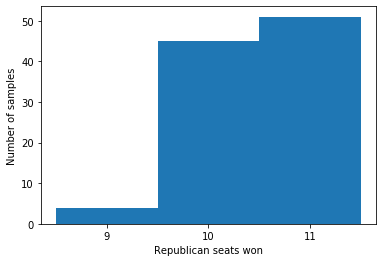

In [192]:
plt.hist(sample_results, bins=[9, 10, 11, 12], align='left')
plt.xticks(range(9, 12))
plt.xlabel('Republican seats won')
plt.ylabel('Number of samples')
plt.show()

Results using Presidential voting patterns

In [29]:
# read candidate party map
with open('data/presidential_candidate_party_map.json', 'r') as read_file:
    pres_candidate_party_map = json.load(read_file)
pres_candidate_party_map

{'clinton': 'democratic',
 'johnson': 'libertarian',
 'trump': 'republican',
 'castle': 'other',
 'stein': 'other',
 'mcmullin': 'other',
 'smith': 'other',
 'byrne': 'other',
 'collins': 'other',
 'maturen': 'other',
 'buchanan': 'other',
 'fox': 'other',
 'elliott': 'other',
 'hoefling': 'other',
 'wilson': 'other',
 'kotlikoff': 'other',
 'muhammad': 'other',
 'cubbler': 'other',
 'allen': 'other',
 'urbach': 'other'}

In [30]:
# read candidate party map
with open('data/presidential_vote_map.json', 'r') as read_file:
    pres_vote_map = json.load(read_file)
pres_vote_map

{'appling county': {'2': {'clinton': 742, 'johnson': 10, 'trump': 427},
  'write-ins': {'castle': 3, 'stein': 3, 'mcmullin': 1},
  '3c': {'clinton': 154, 'johnson': 14, 'trump': 670},
  '4b': {'clinton': 7, 'johnson': 0, 'trump': 305},
  '5b': {'clinton': 79, 'johnson': 3, 'trump': 336},
  '1b': {'clinton': 92, 'johnson': 9, 'trump': 685},
  '3a': {'clinton': 4, 'johnson': 4, 'trump': 209},
  '4a': {'clinton': 14, 'johnson': 1, 'trump': 261},
  '5a': {'clinton': 68, 'johnson': 12, 'trump': 530},
  '4c': {'clinton': 10, 'johnson': 2, 'trump': 284},
  '4d': {'clinton': 83, 'johnson': 10, 'trump': 624},
  '1c': {'clinton': 42, 'johnson': 5, 'trump': 496},
  '3a1': {'clinton': 17, 'johnson': 1, 'trump': 319},
  '3b': {'clinton': 98, 'johnson': 1, 'trump': 101},
  '5c': {'clinton': 24, 'johnson': 5, 'trump': 247}},
 'atkinson county': {'axson': {'clinton': 29, 'johnson': 4, 'trump': 375},
  'pearson city': {'clinton': 275, 'johnson': 9, 'trump': 164},
  'pearson county': {'clinton': 136, 'j

In [176]:
pres_results = results_per_sample(color_data, pres_vote_map, pres_candidate_party_map)
pres_results

[10,
 11,
 9,
 9,
 11,
 10,
 10,
 10,
 10,
 10,
 11,
 10,
 11,
 10,
 11,
 10,
 10,
 10,
 9,
 11,
 9,
 10,
 11,
 11,
 10,
 11,
 10,
 10,
 9,
 9,
 10,
 10,
 10,
 11,
 10,
 10,
 11,
 9,
 10,
 10,
 9,
 10,
 11,
 10,
 10,
 11,
 9,
 9,
 9,
 10,
 9,
 10,
 10,
 11,
 11,
 10,
 10,
 11,
 11,
 11,
 11,
 9,
 10,
 10,
 10,
 11,
 8,
 9,
 11,
 11,
 11,
 11,
 11,
 11,
 10,
 11,
 11,
 11,
 11,
 11,
 10,
 10,
 11,
 10,
 10,
 10,
 10,
 11,
 10,
 11,
 10,
 11,
 10,
 11,
 10,
 10,
 10,
 11,
 10,
 10]

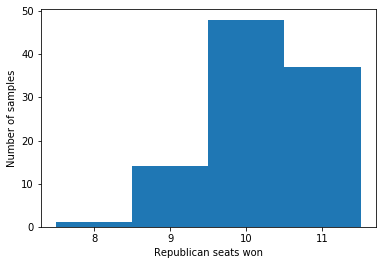

In [191]:
plt.hist(pres_results, bins=[8, 9, 10, 11, 12], align='left')
plt.xticks(range(8, 12))
plt.xlabel('Republican seats won')
plt.ylabel('Number of samples')
plt.show()

In [183]:
# read color samples
with open('data/samples6.json', 'r') as read_file:
    samples6 = json.load(read_file)
samples6

{'num_samples': 100,
 'num_iterations': 10000,
 'beta_type': 'linear',
 'start_beta': 5e-08,
 'end_beta': 0.05,
 'color_list': [{'1462': 12,
   '1461': 12,
   '1460': 12,
   '1459': 12,
   '2306': 1,
   '1458': 12,
   '2305': 1,
   '1457': 12,
   '2304': 1,
   '2303': 2,
   '1456': 12,
   '2302': 2,
   '1455': 12,
   '1454': 12,
   '2301': 3,
   '2300': 3,
   '1453': 12,
   '1452': 13,
   '2309': 1,
   '2308': 1,
   '2307': 1,
   '1473': 12,
   '2320': 1,
   '1472': 12,
   '1471': 12,
   '1470': 12,
   '2317': 1,
   '0': 14,
   '2316': 1,
   '1': 14,
   '1469': 12,
   '2315': 1,
   '2': 14,
   '1468': 12,
   '3': 14,
   '2314': 1,
   '1467': 12,
   '1466': 12,
   '4': 14,
   '2313': 1,
   '1465': 12,
   '2312': 1,
   '5': 14,
   '1464': 12,
   '2311': 1,
   '6': 14,
   '7': 1,
   '1463': 12,
   '2310': 1,
   '8': 14,
   '9': 14,
   '2319': 1,
   '2318': 1,
   '1000': 7,
   '2331': 1,
   '1484': 12,
   '2330': 1,
   '1483': 12,
   '1482': 12,
   '1481': 12,
   '1480': 12,
   '2328': 1,


In [184]:
# results based on house votes for samples with compactness and pop constraint
samples6_house_results = results_per_sample(samples6, vote_map, candidate_party_map)
samples6_house_results

[12,
 10,
 11,
 11,
 10,
 10,
 10,
 10,
 11,
 11,
 11,
 11,
 10,
 11,
 11,
 10,
 10,
 11,
 11,
 11,
 9,
 11,
 11,
 10,
 11,
 10,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 10,
 11,
 11,
 11,
 10,
 9,
 10,
 10,
 11,
 11,
 11,
 10,
 10,
 10,
 10,
 11,
 10,
 11,
 11,
 10,
 10,
 11,
 11,
 10,
 10,
 10,
 11,
 11,
 11,
 11,
 11,
 10,
 10,
 11,
 11,
 10,
 10,
 11,
 10,
 11,
 10,
 10,
 11,
 10,
 11,
 10,
 10,
 11,
 11,
 11,
 11,
 11,
 11,
 10,
 11,
 11,
 11,
 9,
 11,
 10,
 11,
 10,
 11,
 11,
 11,
 11,
 11]

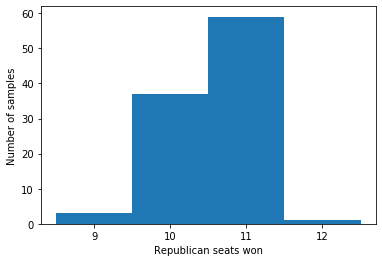

In [190]:
plt.hist(samples6_house_results, bins=[9, 10, 11, 12, 13], align='left')
plt.xticks(range(9, 13))
plt.xlabel('Republican seats won')
plt.ylabel('Number of samples')
plt.show()

In [186]:
# results based on house votes for samples with compactness and pop constraint
samples6_pres_results = results_per_sample(samples6, pres_vote_map, pres_candidate_party_map)
samples6_pres_results

[10,
 10,
 10,
 11,
 10,
 11,
 10,
 10,
 10,
 11,
 11,
 10,
 10,
 10,
 11,
 10,
 10,
 11,
 10,
 11,
 10,
 9,
 11,
 10,
 11,
 9,
 11,
 10,
 11,
 10,
 11,
 11,
 11,
 10,
 10,
 11,
 10,
 10,
 10,
 10,
 11,
 10,
 11,
 10,
 10,
 10,
 10,
 10,
 10,
 10,
 9,
 10,
 10,
 11,
 10,
 11,
 10,
 9,
 11,
 11,
 10,
 11,
 10,
 11,
 10,
 9,
 11,
 10,
 11,
 11,
 11,
 10,
 10,
 10,
 10,
 11,
 10,
 11,
 10,
 9,
 10,
 10,
 10,
 10,
 11,
 11,
 11,
 11,
 10,
 11,
 10,
 11,
 9,
 11,
 9,
 11,
 11,
 11,
 11,
 11]

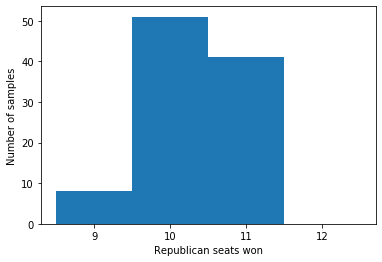

In [189]:
plt.hist(samples6_pres_results, bins=[9, 10, 11, 12, 13], align='left')
plt.xticks(range(9, 13))
plt.xlabel('Republican seats won')
plt.ylabel('Number of samples')
plt.show()

In [31]:
# read color samples for samples7 (t=20000)
with open('data/samples7.json', 'r') as read_file:
    samples7 = json.load(read_file)
samples7

{'num_samples': 100,
 'num_iterations': 20000,
 'beta_type': 'linear',
 'start_beta': 5e-09,
 'end_beta': 0.05,
 'color_list': [{'1462': 11,
   '1461': 11,
   '1460': 11,
   '1459': 11,
   '2306': 2,
   '1458': 11,
   '2305': 2,
   '1457': 11,
   '2304': 2,
   '2303': 3,
   '1456': 11,
   '2302': 3,
   '1455': 11,
   '1454': 11,
   '2301': 2,
   '2300': 2,
   '1453': 11,
   '1452': 12,
   '2309': 2,
   '2308': 2,
   '2307': 2,
   '1473': 11,
   '2320': 2,
   '1472': 11,
   '1471': 11,
   '1470': 11,
   '2317': 13,
   '0': 9,
   '2316': 13,
   '1': 9,
   '1469': 11,
   '2315': 2,
   '2': 9,
   '1468': 11,
   '3': 9,
   '2314': 2,
   '1467': 11,
   '1466': 11,
   '4': 9,
   '2313': 2,
   '1465': 11,
   '2312': 2,
   '5': 9,
   '1464': 11,
   '2311': 2,
   '6': 9,
   '7': 7,
   '1463': 11,
   '2310': 2,
   '8': 9,
   '9': 9,
   '2319': 2,
   '2318': 13,
   '1000': 5,
   '2331': 2,
   '1484': 11,
   '2330': 7,
   '1483': 11,
   '1482': 11,
   '1481': 11,
   '1480': 11,
   '2328': 7,
   '23

In [34]:
# results based on house votes for samples7 with compactness and pop constraint
samples7_house_results = results_per_sample(samples7, vote_map, candidate_party_map)
samples7_house_results

[11,
 9,
 11,
 10,
 10,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 10,
 11,
 11,
 10,
 11,
 11,
 11,
 11,
 10,
 11,
 11,
 10,
 10,
 11,
 11,
 11,
 10,
 11,
 11,
 11,
 10,
 11,
 9,
 9,
 11,
 10,
 10,
 11,
 10,
 10,
 11,
 11,
 11,
 11,
 9,
 11,
 10,
 11,
 10,
 11,
 11,
 10,
 11,
 10,
 11,
 11,
 11,
 11,
 10,
 11,
 10,
 10,
 9,
 10,
 11,
 10,
 11,
 10,
 11,
 11,
 10,
 10,
 10,
 11,
 11,
 11,
 10,
 11,
 11,
 10,
 10,
 9,
 11,
 11,
 10,
 11,
 10,
 11,
 11,
 11,
 10,
 11,
 10,
 11,
 11]

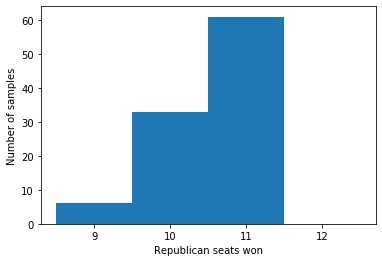

In [35]:
plt.hist(samples7_house_results, bins=[9, 10, 11, 12, 13], align='left')
plt.xticks(range(9, 13))
plt.xlabel('Republican seats won')
plt.ylabel('Number of samples')
plt.show()

In [42]:
# results based on presidential votes for samples7 with compactness and pop constraint
samples7_pres_results = results_per_sample(samples7, pres_vote_map, pres_candidate_party_map)
samples7_pres_results

[11,
 10,
 10,
 10,
 10,
 10,
 11,
 10,
 11,
 11,
 11,
 10,
 11,
 11,
 10,
 10,
 11,
 11,
 9,
 11,
 11,
 11,
 11,
 9,
 10,
 11,
 11,
 9,
 11,
 11,
 10,
 11,
 11,
 10,
 10,
 10,
 10,
 10,
 10,
 11,
 10,
 11,
 10,
 11,
 10,
 10,
 11,
 11,
 11,
 10,
 11,
 9,
 10,
 10,
 11,
 11,
 10,
 11,
 10,
 10,
 11,
 10,
 10,
 11,
 11,
 10,
 11,
 11,
 10,
 10,
 9,
 11,
 9,
 10,
 10,
 10,
 9,
 11,
 11,
 9,
 11,
 11,
 11,
 11,
 10,
 11,
 10,
 11,
 11,
 10,
 10,
 10,
 11,
 11,
 10,
 9,
 11,
 10,
 11,
 11]

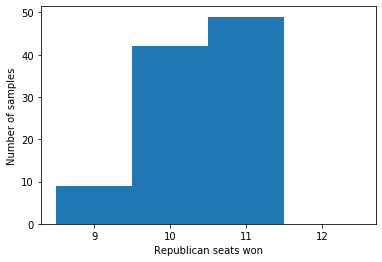

In [37]:
plt.hist(samples7_pres_results, bins=[9, 10, 11, 12, 13], align='left')
plt.xticks(range(9, 13))
plt.xlabel('Republican seats won')
plt.ylabel('Number of samples')
plt.show()

In [47]:
# read color samples for samples8 (t=10000, pop_weight=1e10)
with open('data/samples8.json', 'r') as read_file:
    samples8 = json.load(read_file)
samples8

{'num_samples': 100,
 'num_iterations': 10000,
 'beta_type': 'linear',
 'start_beta': 5e-09,
 'end_beta': 0.05,
 'color_list': [{'1462': 10,
   '1461': 10,
   '1460': 10,
   '1459': 10,
   '2306': 9,
   '1458': 10,
   '2305': 9,
   '1457': 3,
   '2304': 9,
   '2303': 9,
   '1456': 3,
   '2302': 9,
   '1455': 3,
   '1454': 3,
   '2301': 9,
   '2300': 14,
   '1453': 3,
   '1452': 4,
   '2309': 9,
   '2308': 9,
   '2307': 9,
   '1473': 3,
   '2320': 11,
   '1472': 3,
   '1471': 3,
   '1470': 3,
   '2317': 11,
   '0': 6,
   '2316': 11,
   '1': 6,
   '1469': 10,
   '2315': 11,
   '2': 6,
   '1468': 10,
   '3': 6,
   '2314': 11,
   '1467': 3,
   '1466': 10,
   '4': 6,
   '2313': 9,
   '1465': 10,
   '2312': 9,
   '5': 6,
   '1464': 10,
   '2311': 9,
   '6': 6,
   '7': 1,
   '1463': 10,
   '2310': 9,
   '8': 6,
   '9': 6,
   '2319': 11,
   '2318': 11,
   '1000': 2,
   '2331': 1,
   '1484': 3,
   '2330': 1,
   '1483': 3,
   '1482': 3,
   '1481': 3,
   '1480': 3,
   '2328': 1,
   '2327': 11,
  

In [48]:
# results based on house votes for samples8 with compactness and pop constraint
samples8_house_results = results_per_sample(samples8, vote_map, candidate_party_map)
samples8_house_results

[10,
 11,
 11,
 11,
 10,
 11,
 10,
 11,
 9,
 11,
 11,
 10,
 11,
 10,
 10,
 11,
 11,
 11,
 10,
 9,
 11,
 11,
 9,
 9,
 11,
 11,
 10,
 10,
 10,
 10,
 11,
 10,
 11,
 10,
 11,
 11,
 8,
 10,
 10,
 11,
 11,
 10,
 11,
 10,
 10,
 10,
 10,
 10,
 9,
 9,
 11,
 11,
 10,
 11,
 9,
 12,
 9,
 10,
 9,
 11,
 11,
 10,
 11,
 11,
 11,
 11,
 10,
 10,
 11,
 11,
 10,
 11,
 9,
 11,
 11,
 11,
 9,
 11,
 10,
 9,
 11,
 10,
 10,
 9,
 10,
 10,
 11,
 11,
 11,
 10,
 10,
 10,
 10,
 11,
 10,
 10,
 10,
 10,
 10,
 10]

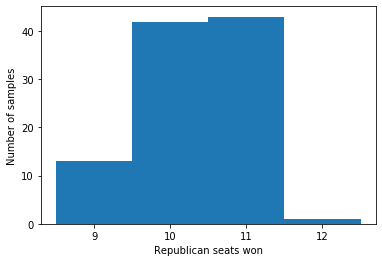

In [49]:
plt.hist(samples8_house_results, bins=[9, 10, 11, 12, 13], align='left')
plt.xticks(range(9, 13))
plt.xlabel('Republican seats won')
plt.ylabel('Number of samples')
plt.show()

In [50]:
samples8_pres_results = results_per_sample(samples8, pres_vote_map, pres_candidate_party_map)
samples8_pres_results

[11,
 9,
 11,
 10,
 11,
 11,
 10,
 10,
 10,
 11,
 10,
 10,
 9,
 10,
 10,
 10,
 11,
 10,
 10,
 9,
 11,
 11,
 9,
 10,
 10,
 11,
 10,
 10,
 11,
 10,
 10,
 10,
 10,
 10,
 10,
 11,
 10,
 10,
 9,
 10,
 10,
 9,
 10,
 10,
 9,
 10,
 9,
 9,
 9,
 10,
 11,
 10,
 10,
 11,
 10,
 11,
 10,
 10,
 9,
 11,
 11,
 10,
 9,
 10,
 11,
 11,
 10,
 9,
 11,
 11,
 9,
 11,
 10,
 10,
 11,
 10,
 9,
 10,
 9,
 9,
 11,
 11,
 10,
 10,
 9,
 10,
 11,
 11,
 11,
 9,
 9,
 9,
 10,
 10,
 9,
 11,
 10,
 10,
 10,
 9]

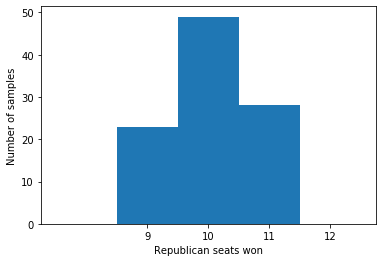

In [52]:
plt.hist(samples8_pres_results, bins=[8, 9, 10, 11, 12, 13], align='left')
plt.xticks(range(9, 13))
plt.xlabel('Republican seats won')
plt.ylabel('Number of samples')
plt.show()

In [54]:
import numpy as np

In [55]:
np.mean(samples8_house_results)

10.3

In [56]:
np.mean(samples8_pres_results)

10.05

In [57]:
# read color samples for samples9 (t=10000, pop_weight=5e10)
with open('data/samples9.json', 'r') as read_file:
    samples9 = json.load(read_file)
samples9

{'num_samples': 100,
 'num_iterations': 10000,
 'beta_type': 'linear',
 'start_beta': 5e-09,
 'end_beta': 0.05,
 'color_list': [{'1462': 8,
   '1461': 8,
   '1460': 8,
   '1459': 8,
   '2306': 3,
   '1458': 6,
   '2305': 3,
   '1457': 8,
   '2304': 3,
   '2303': 3,
   '1456': 8,
   '2302': 3,
   '1455': 8,
   '1454': 8,
   '2301': 3,
   '2300': 14,
   '1453': 5,
   '1452': 5,
   '2309': 3,
   '2308': 3,
   '2307': 3,
   '1473': 8,
   '2320': 12,
   '1472': 8,
   '1471': 8,
   '1470': 8,
   '2317': 12,
   '0': 6,
   '2316': 12,
   '1': 6,
   '1469': 8,
   '2315': 12,
   '2': 6,
   '1468': 8,
   '3': 6,
   '2314': 12,
   '1467': 8,
   '1466': 6,
   '4': 6,
   '2313': 3,
   '1465': 8,
   '2312': 3,
   '5': 6,
   '1464': 8,
   '2311': 3,
   '6': 6,
   '7': 9,
   '1463': 8,
   '2310': 3,
   '8': 6,
   '9': 6,
   '2319': 12,
   '2318': 12,
   '1000': 2,
   '2331': 9,
   '1484': 8,
   '2330': 9,
   '1483': 8,
   '1482': 8,
   '1481': 8,
   '1480': 8,
   '2328': 9,
   '2327': 12,
   '1479': 8,

In [58]:
samples9_pres_results = results_per_sample(samples9, pres_vote_map, pres_candidate_party_map)
samples9_pres_results

[10,
 10,
 9,
 10,
 9,
 10,
 9,
 10,
 10,
 10,
 9,
 10,
 9,
 10,
 9,
 9,
 9,
 10,
 10,
 10,
 10,
 10,
 10,
 11,
 8,
 10,
 11,
 10,
 9,
 10,
 10,
 9,
 10,
 9,
 10,
 11,
 10,
 10,
 10,
 10,
 10,
 10,
 9,
 10,
 10,
 9,
 10,
 10,
 10,
 10,
 10,
 10,
 9,
 9,
 11,
 10,
 11,
 10,
 10,
 9,
 11,
 10,
 11,
 9,
 10,
 10,
 10,
 8,
 10,
 10,
 10,
 11,
 10,
 10,
 11,
 11,
 8,
 11,
 10,
 11,
 10,
 11,
 10,
 9,
 9,
 10,
 9,
 10,
 9,
 11,
 10,
 10,
 10,
 10,
 9,
 10,
 9,
 11,
 11,
 11]

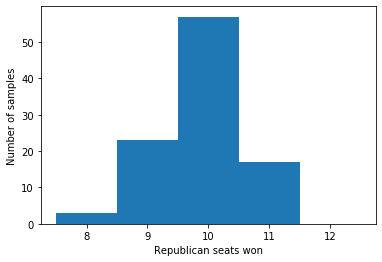

In [63]:
plt.hist(samples9_pres_results, bins=[8, 9, 10, 11, 12, 13], align='left')
plt.xticks(range(8, 13))
plt.xlabel('Republican seats won')
plt.ylabel('Number of samples')
plt.show()

In [60]:
# read color samples for samples10 (t=10000, pop_weight=2.5e10)
with open('data/samples10.json', 'r') as read_file:
    samples10 = json.load(read_file)
samples10

{'num_samples': 100,
 'num_iterations': 10000,
 'beta_type': 'linear',
 'start_beta': 5e-09,
 'end_beta': 0.05,
 'color_list': [{'1462': 10,
   '1461': 10,
   '1460': 10,
   '1459': 10,
   '2306': 12,
   '1458': 10,
   '2305': 12,
   '1457': 10,
   '2304': 12,
   '2303': 9,
   '1456': 10,
   '2302': 9,
   '1455': 10,
   '1454': 10,
   '2301': 9,
   '2300': 9,
   '1453': 13,
   '1452': 13,
   '2309': 12,
   '2308': 12,
   '2307': 14,
   '1473': 10,
   '2320': 14,
   '1472': 10,
   '1471': 10,
   '1470': 10,
   '2317': 14,
   '0': 7,
   '2316': 14,
   '1': 7,
   '1469': 10,
   '2315': 14,
   '2': 7,
   '1468': 10,
   '3': 7,
   '2314': 14,
   '1467': 10,
   '1466': 10,
   '4': 7,
   '2313': 12,
   '1465': 10,
   '2312': 12,
   '5': 7,
   '1464': 10,
   '2311': 12,
   '6': 7,
   '7': 4,
   '1463': 10,
   '2310': 12,
   '8': 7,
   '9': 7,
   '2319': 14,
   '2318': 14,
   '1000': 6,
   '2331': 14,
   '1484': 10,
   '2330': 4,
   '1483': 10,
   '1482': 10,
   '1481': 10,
   '1480': 10,
   '2

In [61]:
samples10_pres_results = results_per_sample(samples10, pres_vote_map, pres_candidate_party_map)
samples10_pres_results

[10,
 10,
 10,
 11,
 10,
 10,
 10,
 9,
 10,
 10,
 9,
 10,
 9,
 10,
 10,
 10,
 11,
 10,
 9,
 11,
 10,
 10,
 11,
 9,
 9,
 11,
 9,
 10,
 11,
 9,
 9,
 10,
 9,
 11,
 10,
 11,
 10,
 9,
 11,
 10,
 10,
 10,
 10,
 11,
 10,
 10,
 10,
 11,
 10,
 10,
 10,
 10,
 11,
 8,
 9,
 10,
 10,
 10,
 11,
 9,
 10,
 10,
 10,
 10,
 10,
 9,
 10,
 10,
 10,
 11,
 10,
 11,
 10,
 9,
 10,
 9,
 11,
 9,
 10,
 11,
 9,
 11,
 10,
 9,
 10,
 9,
 10,
 10,
 10,
 10,
 11,
 10,
 10,
 9,
 9,
 11,
 10,
 11,
 10,
 10]

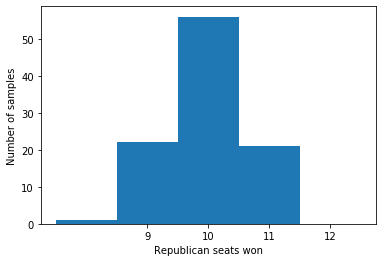

In [62]:
plt.hist(samples10_pres_results, bins=[8, 9, 10, 11, 12, 13], align='left')
plt.xticks(range(9, 13))
plt.xlabel('Republican seats won')
plt.ylabel('Number of samples')
plt.show()

In [75]:
sum(map(lambda x: x >= 10, samples9_pres_results))

74